In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import cv2
from PIL import Image
from einops import rearrange, einsum

import torch
import torch.nn.functional as F
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import transforms, datasets
from transformers import SegformerForSemanticSegmentation, SegformerFeatureExtractor, SegformerConfig
torch.manual_seed(4)

transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
])

2023-08-26 00:05:29.888928: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
dataset = datasets.OxfordIIITPet(root='./data', target_types='segmentation', target_transform=transform, download=True, transform=transform)
train_set, test_set = torch.utils.data.random_split(dataset, [3500, len(dataset)-3500])
batch_size = 16
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)

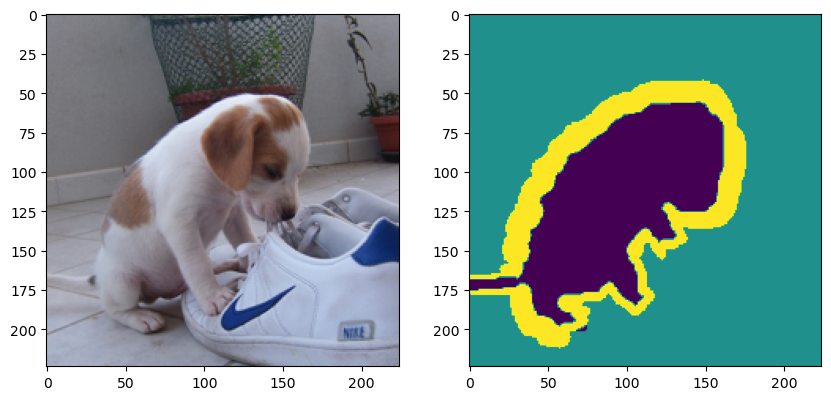

In [3]:
a, b = next(iter(train_loader))

# print(a.shape)
# print(b.shape)

# print(a[0])
# print(b[0])

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

data_index = 10
ax[0].imshow(a[data_index].permute(1, 2, 0))
ax[1].imshow(b[data_index, 0])

In [5]:
id2label = {0: "outer", 1: "inner", 2: "border"}
label2id = {label: id for id, label in id2label.items()}
model = SegformerForSemanticSegmentation.from_pretrained("nvidia/mit-b0", ignore_mismatched_sizes=True,
                                                         num_labels=len(id2label), id2label=id2label, label2id=label2id,
                                                         reshape_last_stage=True)
model.load_state_dict(torch.load('./model_state_dicts/segformer_miou90.pth', map_location=torch.device('cpu')))

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b0 and are newly initialized: ['decode_head.batch_norm.num_batches_tracked', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.classifier.bias', 'decode_head.linear_c.3.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_fuse.weight', 'decode_head.linear_c.1.proj.bias', 'decode_head.batch_norm.running_mean', 'decode_head.batch_norm.bias', 'decode_head.classifier.weight', 'decode_head.batch_norm.weight', 'decode_head.batch_norm.running_var', 'decode_head.linear_c.0.proj.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


<All keys matched successfully>

In [6]:
def preprocess_image(img):
    means = [0.485, 0.456, 0.406]
    stds = [0.229, 0.224, 0.225]

    preprocessed_img = img.copy()[:, :, ::-1]
    for i in range(3):
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] - means[i]
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] / stds[i]
    preprocessed_img = \
        np.ascontiguousarray(np.transpose(preprocessed_img, (2, 0, 1)))
    preprocessed_img = torch.from_numpy(preprocessed_img)
    preprocessed_img.unsqueeze_(0)
    input = preprocessed_img.requires_grad_(True)
    return input

In [21]:
print(model)

SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (encoder): SegformerEncoder(
      (patch_embeddings): ModuleList(
        (0): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 32, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
        )
        (1): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (2): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(64, 160, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((160,), eps=1e-05, elementwise_affine=True)
        )
        (3): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(160, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  

### Add hook to attention input

In [7]:
class GradCam(nn.Module):
    def __init__(self, model, layer):
        super().__init__()
        self.model = model
        self.layer = layer
        self.register_hooks()

    def register_hooks(self):
        for module_name, module in self.model._modules.items():
            if module_name == 'segformer':
                for layer_name, module in module._modules.items():
                    if layer_name == 'encoder':
                        for layer_name1, module1 in module._modules.items():
                            if layer_name1 == 'block':
                                for layer_name2, module2 in module1._modules.items():
                                    if layer_name2 == self.layer[0]:
                                        for layer_name3, module3 in module2._modules.items():
                                            if layer_name3 == self.layer[1]:
                                                for layer_name4, module4 in module3._modules.items():
                                                    if layer_name4 == 'layer_norm_1':
                                                        module4.register_forward_hook(self.forward_hook)
                                                        module4.register_backward_hook(self.backward_hook)

    def forward(self, input, target_index):
        outs = self.model(input).logits
        outs = outs.squeeze()

       
        if target_index is None:
            
            target_index = torch.argmax(outs, dim=0)

        if target_index == 0:
            outs[0, 0, 0].backward(retain_graph=True)
        elif target_index == 1:
            outs[1, 0, 0].backward(retain_graph=True)
        else:
            outs[2, 0, 0].backward(retain_graph=True)
       
        height = np.sqrt(self.forward_result.shape[0]).astype(int)
        self.forward_result = rearrange(self.forward_result, '(h w) c -> c h w', h = height)
        self.backward_result = rearrange(self.backward_result, '(h w) c -> c h w', h = height)
        a_k = torch.mean(self.backward_result, dim=(1, 2), keepdim=True)     

        out = torch.sum(a_k * self.forward_result, dim=0).cpu()              
        out = torch.relu(out) / torch.max(out) 
        out = F.upsample_bilinear(out.unsqueeze(0).unsqueeze(0), [224, 224]) 
        return out.cpu().detach().squeeze().numpy()

    def forward_hook(self, _, input, output):
        self.forward_result = torch.squeeze(output)

    def backward_hook(self, _, grad_input, grad_output):
        self.backward_result = torch.squeeze(grad_output[0])

In [8]:
# fig, ax = plt.subplots(8, 3, figsize=(8, 20))
img = a[data_index].permute(1, 2, 0).detach().cpu().numpy()
img = preprocess_image(img)
layer_list = [("0", "0"), ("0", "1"), ("1", "0"), ("1", "1"), ("2", "0"), ("2", "1"), ("3", "0"), ("3", "1")]
attn_in_0 = []
attn_in_1 = []
attn_in_2 = []

for index, layer in enumerate(layer_list):
    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 0)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    attn_in_0.append(cam)
    # ax[index, 0].imshow(cam)
    # ax[index, 0].axis('off')
    # ax[index, 0].set_title(f"{layer[0]}_{layer[1]}_attn_in")

    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 1)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    attn_in_1.append(cam)
    # ax[index, 1].imshow(cam)
    # ax[index, 1].axis('off')
    # ax[index, 1].set_title(f"{layer[0]}_{layer[1]}_attn_in")

    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 2)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    attn_in_2.append(cam)
    # ax[index, 2].imshow(cam)
    # ax[index, 2].axis('off')
    # ax[index, 2].set_title(f"{layer[0]}_{layer[1]}_attn_in")

/opt/anaconda3/envs/ai/lib/python3.9/site-packages/torch/nn/modules/module.py:1117: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
/opt/anaconda3/envs/ai/lib/python3.9/site-packages/torch/nn/functional.py:4070: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


### Add hook to attention output

In [9]:
import torch.nn.functional as F

class GradCam(nn.Module):
    def __init__(self, model, layer):
        super().__init__()
        self.model = model
        self.layer = layer
        self.register_hooks()

    def register_hooks(self):
        for module_name, module in self.model._modules.items():
            if module_name == 'segformer':
                for layer_name, module in module._modules.items():
                    if layer_name == 'encoder':
                        for layer_name1, module1 in module._modules.items():
                            if layer_name1 == 'block':
                                for layer_name2, module2 in module1._modules.items():
                                    if layer_name2 == self.layer[0]:
                                        for layer_name3, module3 in module2._modules.items():
                                            if layer_name3 == self.layer[1]:
                                                for layer_name4, module4 in module3._modules.items():
                                                    if layer_name4 == 'attention':
                                                        for layer_name5, module5 in module4._modules.items():
                                                            if layer_name5 == 'self':
                                                                for layer_name6, module6 in module5._modules.items():
                                                                    if layer_name6 == 'dropout':
                                                                        module6.register_forward_hook(self.forward_hook)
                                                                        module6.register_backward_hook(self.backward_hook)


    def forward(self, input, target_index):
        outs = self.model(input).logits
        outs = outs.squeeze() 

     
        if target_index is None:
        
            target_index = torch.argmax(outs, dim=0)

        if target_index == 0:
            outs[0, 0, 0].backward(retain_graph=True)
        elif target_index == 1:
            outs[1, 0, 0].backward(retain_graph=True)
        else:
            outs[2, 0, 0].backward(retain_graph=True)

        if len(self.forward_result.shape) == 2:
            height = np.sqrt(self.forward_result.shape[0]).astype(int)
            self.forward_result = rearrange(self.forward_result, '(h w) c -> c h w', h = height)
            self.backward_result = rearrange(self.backward_result, '(h w) c -> c h w', h = height)
        else:
            height = np.sqrt(self.forward_result.shape[1]).astype(int)
            self.forward_result = rearrange(self.forward_result, 'k (h w) c -> (c k) h w', h = height)
            self.backward_result = rearrange(self.backward_result, 'k (h w) c -> (c k) h w', h = height)

        a_k = torch.mean(self.backward_result, dim=(1, 2), keepdim=True)       

        out = torch.sum(a_k * self.forward_result, dim=0).cpu()              
        out = torch.relu(out) / torch.max(out) 
        out = F.upsample_bilinear(out.unsqueeze(0).unsqueeze(0), [224, 224])
        return out.cpu().detach().squeeze().numpy()

    def forward_hook(self, _, input, output):
        self.forward_result = torch.squeeze(output)

    def backward_hook(self, _, grad_input, grad_output):
        self.backward_result = torch.squeeze(grad_output[0])

In [10]:
# fig, ax = plt.subplots(8, 3, figsize=(8, 20))
img = a[data_index].permute(1, 2, 0).detach().cpu().numpy()
img = preprocess_image(img)
layer_list = [("0", "0"), ("0", "1"), ("1", "0"), ("1", "1"), ("2", "0"), ("2", "1"), ("3", "0"), ("3", "1")]
attn_out_0 = []
attn_out_1 = []
attn_out_2 = []

for index, layer in enumerate(layer_list):
    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 0)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    attn_out_0.append(cam)
    # ax[index, 0].imshow(cam)
    # ax[index, 0].axis('off')
    # ax[index, 0].set_title(f"{layer[0]}_{layer[1]}_attn_out")

    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 1)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    attn_out_1.append(cam)
    # ax[index, 1].imshow(cam)
    # ax[index, 1].axis('off')
    # ax[index, 1].set_title(f"{layer[0]}_{layer[1]}_attn_out")

    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 2)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    attn_out_2.append(cam)
    # ax[index, 2].imshow(cam)
    # ax[index, 2].axis('off')
    # ax[index, 2].set_title(f"{layer[0]}_{layer[1]}_attn_out")

### Add hook to mix-ffn deptwise-convolution

In [14]:
import torch.nn.functional as F

class GradCam(nn.Module):
    def __init__(self, model, layer):
        super().__init__()
        self.model = model
        self.layer = layer
        self.register_hooks()

    def register_hooks(self):
        for module_name, module in self.model._modules.items():
            if module_name == 'segformer':
                for layer_name, module in module._modules.items():
                    if layer_name == 'encoder':
                        for layer_name1, module1 in module._modules.items():
                            if layer_name1 == 'block':
                                for layer_name2, module2 in module1._modules.items():
                                    if layer_name2 == self.layer[0]:
                                        for layer_name3, module3 in module2._modules.items():
                                            if layer_name3 == self.layer[1]:
                                                for layer_name4, module4 in module3._modules.items():
                                                    if layer_name4 == 'mlp':
                                                        for layer_name5, module5 in module4._modules.items():
                                                            if layer_name5 == 'dwconv':
                                                                for layer_name6, module6 in module5._modules.items():
                                                                    if layer_name6 == 'dwconv':
                                                                        module6.register_forward_hook(self.forward_hook)
                                                                        module6.register_backward_hook(self.backward_hook)

    def forward(self, input, target_index):
        outs = self.model(input).logits
        outs = outs.squeeze()  # [1, num_classes]  --> [num_classes]

        # 가장 큰 값을 가지는 것을 target index 로 사용
        if target_index is None:
            # target_index = outs.argmax()
            target_index = torch.argmax(outs, dim=0)

        if target_index == 0:
            outs[0, 0, 0].backward(retain_graph=True)
        elif target_index == 1:
            outs[1, 0, 0].backward(retain_graph=True)
        else:
            outs[2, 0, 0].backward(retain_graph=True)
        # outs[target_index][0, 0].backward(retain_graph=True)
        # outs[2, 0, 25].backward(retain_graph=True)
        # print(self.forward_result.shape)
        a_k = torch.mean(self.backward_result, dim=(1, 2), keepdim=True)         # [512, 1, 1]

        out = torch.sum(a_k * self.forward_result, dim=0).cpu()                  # [512, 7, 7] * [512, 1, 1]
        out = torch.relu(out) / torch.max(out)  # 음수를 없애고, 0 ~ 1 로 scaling # [7, 7]
        out = F.upsample_bilinear(out.unsqueeze(0).unsqueeze(0), [224, 224])  # 4D로 바꿈
        return out.cpu().detach().squeeze().numpy()

    def forward_hook(self, _, input, output):
        self.forward_result = torch.squeeze(output)

    def backward_hook(self, _, grad_input, grad_output):
        self.backward_result = torch.squeeze(grad_output[0])

In [ ]:
# fig, ax = plt.subplots(8, 3, figsize=(8, 20))
img = a[data_index].permute(1, 2, 0).detach().cpu().numpy()
img = preprocess_image(img)
layer_list = [("0", "0"), ("0", "1"), ("1", "0"), ("1", "1"), ("2", "0"), ("2", "1"), ("3", "0"), ("3", "1")]
mixffn_dwconv_0 = []
mixffn_dwconv_1 = []
mixffn_dwconv_2 = []

for index, layer in enumerate(layer_list):
    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 0)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    mixffn_dwconv_0.append(cam)
    # ax[index, 0].imshow(cam)
    # ax[index, 0].axis('off')
    # ax[index, 0].set_title(f"{layer[0]}_{layer[1]}_mixffn_dwconv")

    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 1)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    mixffn_dwconv_1.append(cam)
    # ax[index, 1].imshow(cam)
    # ax[index, 1].axis('off')
    # ax[index, 1].set_title(f"{layer[0]}_{layer[1]}_mixffn_dwconv")

    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 2)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    mixffn_dwconv_2.append(cam)
    # ax[index, 2].imshow(cam)
    # ax[index, 2].axis('off')
    # ax[index, 2].set_title(f"{layer[0]}_{layer[1]}_mixffn_dwconv")

### Add hook to projection

In [16]:
import torch.nn.functional as F

class GradCam(nn.Module):
    def __init__(self, model, layer):
        super().__init__()
        self.model = model
        self.layer = layer
        self.register_hooks()

    def register_hooks(self):
        for module_name, module in self.model._modules.items():
            if module_name == 'segformer':
                for layer_name, module in module._modules.items():
                    if layer_name == 'encoder':
                        for layer_name1, module1 in module._modules.items():
                            if layer_name1 == 'patch_embeddings':
                                for layer_name2, module2 in module1._modules.items():
                                    if layer_name2 == self.layer:
                                        for layer_name3, module3 in module2._modules.items():
                                            if layer_name3 == 'layer_norm':
                                                module3.register_forward_hook(self.forward_hook)
                                                module3.register_backward_hook(self.backward_hook)

    def forward(self, input, target_index):
        outs = self.model(input).logits
        outs = outs.squeeze()  

        
        if target_index is None:
            
            target_index = torch.argmax(outs, dim=0)

        if target_index == 0:
            outs[0, 0, 0].backward(retain_graph=True)
        elif target_index == 1:
            outs[1, 0, 0].backward(retain_graph=True)
        else:
            outs[2, 0, 0].backward(retain_graph=True)

        if len(self.forward_result.shape) == 2:
            height = np.sqrt(self.forward_result.shape[0]).astype(int)
            self.forward_result = rearrange(self.forward_result, '(h w) c -> c h w', h = height)
            self.backward_result = rearrange(self.backward_result, '(h w) c -> c h w', h = height)
        else:
            height = np.sqrt(self.forward_result.shape[1]).astype(int)
            self.forward_result = rearrange(self.forward_result, 'k (h w) c -> (c k) h w', h = height)
            self.backward_result = rearrange(self.backward_result, 'k (h w) c -> (c k) h w', h = height)


        a_k = torch.mean(self.backward_result, dim=(1, 2), keepdim=True)         

        out = torch.sum(a_k * self.forward_result, dim=0).cpu()                  
        out = torch.relu(out) / torch.max(out) 
        out = F.upsample_bilinear(out.unsqueeze(0).unsqueeze(0), [224, 224]) 
        return out.cpu().detach().squeeze().numpy()

    def forward_hook(self, _, input, output):
        self.forward_result = torch.squeeze(output)

    def backward_hook(self, _, grad_input, grad_output):
        self.backward_result = torch.squeeze(grad_output[0])

In [17]:
# fig, ax = plt.subplots(4, 3, figsize=(8, 12))
img = a[data_index].permute(1, 2, 0).detach().cpu().numpy()
img = preprocess_image(img)
layer_list = ['0', '1', '2', '3']
proj_0 = []
proj_1 = []
proj_2 = []

for index, layer in enumerate(layer_list):
    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 0)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    proj_0.append(cam)
    # ax[index, 0].imshow(cam)
    # ax[index, 0].axis('off')
    # ax[index, 0].set_title(f"{layer}_proj")

    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 1)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    proj_1.append(cam)
    # ax[index, 1].imshow(cam)
    # ax[index, 1].axis('off')
    # ax[index, 1].set_title(f"{layer}_proj")

    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 2)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    proj_2.append(cam)
    # ax[index, 2].imshow(cam)
    # ax[index, 2].axis('off')
    # ax[index, 2].set_title(f"{layer}_proj")

### Add hook to classification layers

In [18]:
import torch.nn.functional as F

class GradCam(nn.Module):
    def __init__(self, model, layer):
        super().__init__()
        self.model = model
        self.layer = layer
        self.register_hooks()

    def register_hooks(self):
        for module_name, module in self.model._modules.items():
            if module_name == 'decode_head':
                for layer_name, module in module._modules.items():
                    if layer_name == self.layer:
                        module.register_forward_hook(self.forward_hook)
                        module.register_backward_hook(self.backward_hook)

    def forward(self, input, target_index):
        outs = self.model(input).logits
        outs = outs.squeeze()  # [1, num_classes]  --> [num_classes]

        # 가장 큰 값을 가지는 것을 target index 로 사용
        if target_index is None:
            # target_index = outs.argmax()
            target_index = torch.argmax(outs, dim=0)

        if target_index == 0:
            outs[0, 0, 0].backward(retain_graph=True)
        elif target_index == 1:
            outs[1, 0, 0].backward(retain_graph=True)
        else:
            outs[2, 0, 0].backward(retain_graph=True)
        # outs[target_index][0, 0].backward(retain_graph=True)
        # outs[2, 0, 25].backward(retain_graph=True)
        # print(self.forward_result.shape)
        a_k = torch.mean(self.backward_result, dim=(1, 2), keepdim=True)         # [512, 1, 1]

        out = torch.sum(a_k * self.forward_result, dim=0).cpu()                  # [512, 7, 7] * [512, 1, 1]
        out = torch.relu(out) / torch.max(out)  # 음수를 없애고, 0 ~ 1 로 scaling # [7, 7]
        out = F.upsample_bilinear(out.unsqueeze(0).unsqueeze(0), [224, 224])  # 4D로 바꿈
        return out.cpu().detach().squeeze().numpy()

    def forward_hook(self, _, input, output):
        self.forward_result = torch.squeeze(output)

    def backward_hook(self, _, grad_input, grad_output):
        self.backward_result = torch.squeeze(grad_output[0])

In [19]:
# fig, ax = plt.subplots(5, 3, figsize=(8, 12))
img = a[data_index].permute(1, 2, 0).detach().cpu().numpy()
img = preprocess_image(img)
layer_list = ['linear_fuse', 'batch_norm', 'activation', 'dropout', 'classifier']
decoder_0 = []
decoder_1 = []
decoder_2 = []

for index, layer in enumerate(layer_list):
    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 0)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    decoder_0.append(cam)
    # ax[index, 0].imshow(cam)
    # ax[index, 0].axis('off')
    # ax[index, 0].set_title(layer)

    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 1)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    decoder_1.append(cam)
    # ax[index, 1].imshow(cam)
    # ax[index, 1].axis('off')
    # ax[index, 1].set_title(layer)

    grad_cam = GradCam(model=model, layer=layer)
    mask = grad_cam(img, 2)
    heatmap = cv2.applyColorMap(np.uint8(mask * 255), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
    cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
    cam = cam / np.max(cam)
    decoder_2.append(cam)
    # ax[index, 2].imshow(cam)
    # ax[index, 2].axis('off')
    # ax[index, 2].set_title(layer)

### Plot Grad-CAM

Text(0.5, 1.0, 'Target')

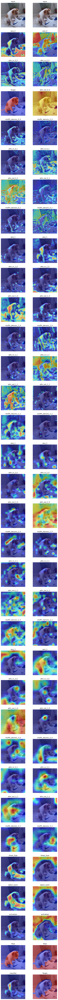

In [20]:
fig, ax = plt.subplots(34, 2, figsize=(8, 136))
ax[0, 0].imshow(a[data_index].permute(1, 2, 0))
ax[0, 0].axis('off')
ax[0, 0].set_title('input')

i = 1
for block_index in range(4):
    ax[i, 0].imshow(proj_0[block_index])
    ax[i, 0].axis('off')
    ax[i, 0].set_title(f"proj_{block_index}")

    ax[i+1, 0].imshow(attn_in_0[block_index * 2])
    ax[i+1, 0].axis('off')
    ax[i+1, 0].set_title(f"attn_in_{block_index}_0")

    ax[i+2, 0].imshow(attn_out_0[block_index * 2])
    ax[i+2, 0].axis('off')
    ax[i+2, 0].set_title(f"attn_out_{block_index}_0")

    ax[i+3, 0].imshow(mixffn_dwconv_0[block_index * 2])
    ax[i+3, 0].axis('off')
    ax[i+3, 0].set_title(f"mixffn_dwconv_{block_index}_0")

    ax[i+4, 0].imshow(attn_in_0[block_index * 2 + 1])
    ax[i+4, 0].axis('off')
    ax[i+4, 0].set_title(f"attn_in_{block_index}_1")

    ax[i+5, 0].imshow(attn_out_0[block_index * 2 + 1])
    ax[i+5, 0].axis('off')
    ax[i+5, 0].set_title(f"attn_out_{block_index}_1")

    ax[i+6, 0].imshow(mixffn_dwconv_0[block_index * 2 + 1])
    ax[i+6, 0].axis('off')
    ax[i+6, 0].set_title(f"mixffn_dwconv_{block_index}_1")

    i += 7

layer_list = ['linear_fuse', 'batch_norm', 'activation', 'dropout', 'classifier']
for index, layer in enumerate(layer_list):
    ax[i+index, 0].imshow(decoder_0[index])
    ax[i+index, 0].axis('off')
    ax[i+index, 0].set_title(layer)

output = model(a[data_index].unsqueeze(0)).logits
upsampled_logits = nn.functional.interpolate(output, scale_factor=4, mode="bilinear", align_corners=False)
seg_map = upsampled_logits.argmax(dim=1) == 0
heatmap = cv2.applyColorMap(np.uint8(seg_map.squeeze() * 255), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
cam = cam / np.max(cam)
ax[32, 0].imshow(cam)
ax[32, 0].axis('off')
ax[32, 0].set_title('Pred')

unique_values, y_class = torch.unique(b, return_inverse=True)
y_onehot = nn.functional.one_hot(y_class, 3).squeeze(dim=1).permute(0, 3, 1, 2).to(torch.float32)
heatmap = cv2.applyColorMap(np.uint8(y_onehot[data_index, 0] * 255), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
cam = cam / np.max(cam)
ax[3, 0].imshow(cam)
ax[3, 0].axis('off')
ax[3, 0].set_title('Target')

ax[0, 1].imshow(a[data_index].permute(1, 2, 0))
ax[0, 1].axis('off')
ax[0, 1].set_title('input')

i = 1
for block_index in range(4):
    ax[i, 1].imshow(proj_1[block_index])
    ax[i, 1].axis('off')
    ax[i, 1].set_title(f"proj_{block_index}")

    ax[i+1, 1].imshow(attn_in_1[block_index * 2])
    ax[i+1, 1].axis('off')
    ax[i+1, 1].set_title(f"attn_in_{block_index}_0")

    ax[i+2, 1].imshow(attn_out_1[block_index * 2])
    ax[i+2, 1].axis('off')
    ax[i+2, 1].set_title(f"attn_out_{block_index}_0")

    ax[i+3, 1].imshow(mixffn_dwconv_1[block_index * 2])
    ax[i+3, 1].axis('off')
    ax[i+3, 1].set_title(f"mixffn_dwconv_{block_index}_0")

    ax[i+4, 1].imshow(attn_in_1[block_index * 2 + 1])
    ax[i+4, 1].axis('off')
    ax[i+4, 1].set_title(f"attn_in_{block_index}_1")

    ax[i+5, 1].imshow(attn_out_1[block_index * 2 + 1])
    ax[i+5, 1].axis('off')
    ax[i+5, 1].set_title(f"attn_out_{block_index}_1")

    ax[i+6, 1].imshow(mixffn_dwconv_1[block_index * 2 + 1])
    ax[i+6, 1].axis('off')
    ax[i+6, 1].set_title(f"mixffn_dwconv_{block_index}_1")

    i += 7

layer_list = ['linear_fuse', 'batch_norm', 'activation', 'dropout', 'classifier']
for index, layer in enumerate(layer_list):
    ax[i+index, 1].imshow(decoder_1[index])
    ax[i+index, 1].axis('off')
    ax[i+index, 1].set_title(layer)

output = model(a[data_index].unsqueeze(0)).logits
upsampled_logits = nn.functional.interpolate(output, scale_factor=4, mode="bilinear", align_corners=False)
seg_map = upsampled_logits.argmax(dim=1) == 1
heatmap = cv2.applyColorMap(np.uint8(seg_map.squeeze() * 255), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
cam = cam / np.max(cam)
ax[32, 1].imshow(cam)
ax[32, 1].axis('off')
ax[32, 1].set_title('Pred')

unique_values, y_class = torch.unique(b, return_inverse=True)
y_onehot = nn.functional.one_hot(y_class, 3).squeeze(dim=1).permute(0, 3, 1, 2).to(torch.float32)
heatmap = cv2.applyColorMap(np.uint8(y_onehot[data_index, 1] * 255), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap,cv2.COLOR_BGR2RGB)
cam = (np.float32(heatmap) / 255) + np.float32(a[data_index].permute(1, 2, 0))
cam = cam / np.max(cam)
ax[33, 1].imshow(cam)
ax[33, 1].axis('off')
ax[33, 1].set_title('Target')